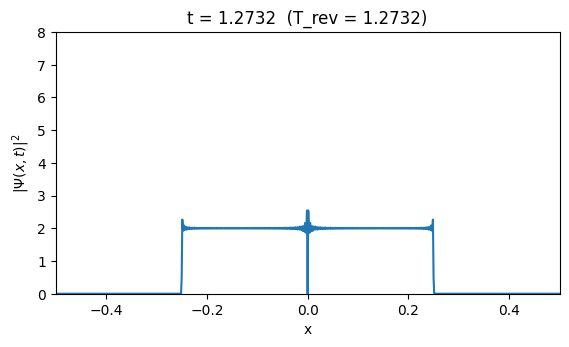

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML, display

# Parameters
a = 1.0
Nx = 800
nmax = 1000
Nt = 481
t_fraction_of_Trev = 1

# Grid and initial Ψ(x,0)
# Initial condition / wavefunction at t = 0
x = np.linspace(-a/2, a/2, Nx, endpoint=False)
Psi0 = np.zeros_like(x)
Psi0[(x >= -a/4) & (x <= 0)] =  np.sqrt(2/a)
Psi0[(x > 0)    & (x <= a/4)] = -np.sqrt(2/a)

# Eigenbasis / stationary states 
def psi_n(n, x):
    return np.sqrt(2/a) * np.sin(n*np.pi*(x - a/2)/a)

# c_n coefficients
def c_n(n):
    if n % 2 == 1: return 0.0
    if n % 8 == 0: return 0.0
    if n % 4 == 2: return  4/(n*np.pi)
    if n % 8 == 4: return -8/(n*np.pi)
    return 0.0

ns = np.arange(1, nmax+1)
cs = np.array([c_n(n) for n in ns])
# Remove the terms with c_n = 0
mask = cs != 0
ns_use = ns[mask]
cs_use = cs[mask]

# The stationary states
phis = np.stack([psi_n(n, x) for n in ns_use], axis=0)
# Energy of the stationary states
En = (np.pi**2/2) * ns_use**2  # m = ħ = a = 1 units

# Time grid
T_rev = 4/np.pi
tmax = t_fraction_of_Trev * T_rev
ts = np.linspace(0.0, tmax, Nt)

# Plot
fig, ax = plt.subplots(figsize=(6.5, 3.4))
(line,) = ax.plot(x, np.abs(Psi0)**2)
ax.set_xlim(-a/2, a/2)
ax.set_ylim(0, 8/a)
ax.set_xlabel("x")
ax.set_ylabel(r"$|\Psi(x,t)|^2$")
title = ax.set_title("t = 0")

# Animation
def update(i):
    t = ts[i]
    # The phase factors
    phase = np.exp(-1j * En * t)
    # Combine the c_n's, stationary states, and phase factors.
    Psi_t = np.einsum("n,n,nx->x", cs_use, phase, phis)
    line.set_ydata(np.abs(Psi_t)**2)
    title.set_text(f"t = {t:.4f}  (T_rev = {T_rev:.4f})")
    return (line, title)

ani = FuncAnimation(fig, update, frames=len(ts), blit=True, interval=60)

# Display inline in JupyterLab
display(HTML(ani.to_jshtml()))
